# Image Detection and Relaxation - EP2

## AIM
To perform image detection and apply relaxation techniques to refine the detected features.

## OBJECTIVE
- To detect edges/features in a given image using operators like Sobel or Canny
- To apply relaxation to remove noise and improve the consistency of detected regions
- To understand iterative refinement of binary/feature maps

## PROCEDURE
1. Import necessary libraries (OpenCV / Python)
2. Load the input image and convert it to grayscale
3. Apply detection methods:
   - Edge detection: Sobel / Canny
   - Corner detection: Harris
   - Blob detection: LoG / DoG
4. Generate the initial detection map
5. Apply relaxation:
   - For each pixel, check its neighborhood (3×3 or 5×5)
   - Update the pixel value based on the majority of neighbors
   - Repeat the process for several iterations until stable
6. Display the refined output after relaxation
7. Compare the initial detection and the relaxed result

## 1. Import Required Libraries

In [7]:
# Import necessary libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import feature, filters, morphology
from skimage.feature import blob_dog, blob_log
from scipy import ndimage
import os

# Set up matplotlib for better display
plt.rcParams['figure.figsize'] = (15, 10)
plt.rcParams['axes.grid'] = False

print("All libraries imported successfully!")

All libraries imported successfully!


## 2. Load and Preprocess Image

Created sample image for demonstration


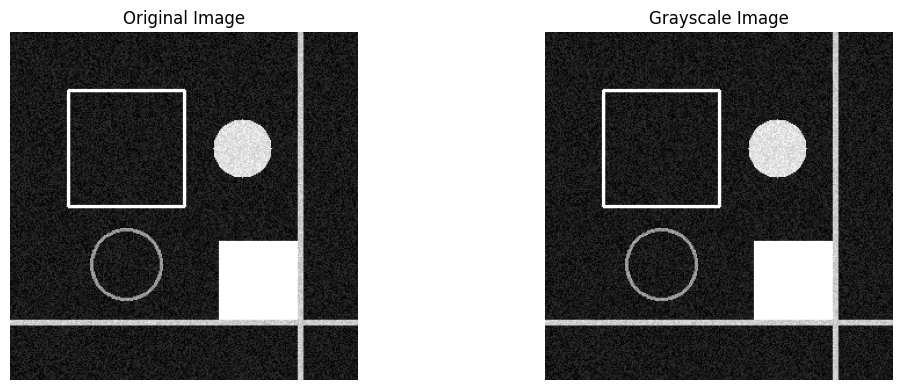

Image shape: (300, 300)
Image data type: uint8
Image value range: [0, 255]


In [8]:
# Create a sample image or load an existing one
def create_sample_image():
    """Create a sample image with various features for detection"""
    img = np.zeros((300, 300), dtype=np.uint8)
    
    # Add rectangles
    cv2.rectangle(img, (50, 50), (150, 150), 255, 2)
    cv2.rectangle(img, (180, 180), (250, 250), 255, -1)
    
    # Add circles
    cv2.circle(img, (100, 200), 30, 128, 2)
    cv2.circle(img, (200, 100), 25, 200, -1)
    
    # Add lines
    cv2.line(img, (0, 250), (300, 250), 180, 3)
    cv2.line(img, (250, 0), (250, 300), 180, 3)
    
    # Add noise
    noise = np.random.randint(0, 50, (300, 300))
    img = np.clip(img.astype(np.float32) + noise, 0, 255).astype(np.uint8)
    
    return img

# Load or create image
try:
    # Try to load an image from the EP1 directory
    image_path = "../EP1/sample_image.jpg"
    if os.path.exists(image_path):
        image = cv2.imread(image_path, cv2.IMREAD_COLOR)
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        print(f"Loaded image from: {image_path}")
    else:
        gray_image = create_sample_image()
        image = cv2.cvtColor(gray_image, cv2.COLOR_GRAY2BGR)
        print("Created sample image for demonstration")
except:
    gray_image = create_sample_image()
    image = cv2.cvtColor(gray_image, cv2.COLOR_GRAY2BGR)
    print("Created sample image for demonstration")

# Display the original image
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.imshow(image if len(image.shape) == 3 else gray_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(gray_image, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')

plt.tight_layout()
plt.show()

print(f"Image shape: {gray_image.shape}")
print(f"Image data type: {gray_image.dtype}")
print(f"Image value range: [{gray_image.min()}, {gray_image.max()}]")

## 3. Edge Detection with Sobel Operator

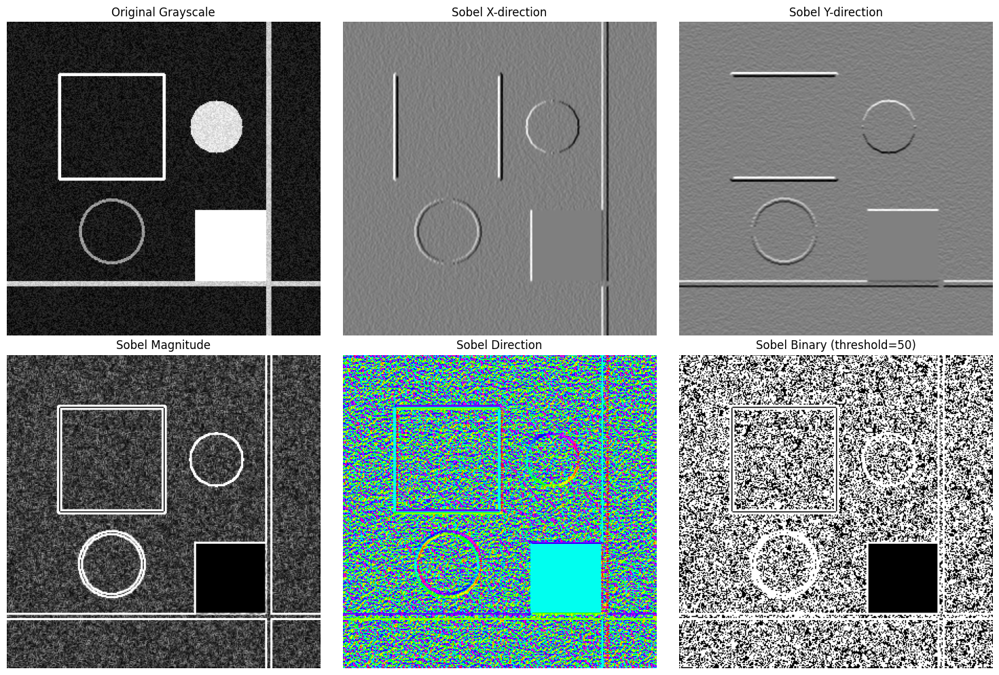

Sobel magnitude range: [0, 255]
Number of edge pixels: 54403


In [9]:
# Apply Sobel edge detection
def apply_sobel_detection(image):
    """Apply Sobel edge detection in both X and Y directions"""
    # Calculate gradients in x and y directions
    sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
    
    # Calculate magnitude
    sobel_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
    sobel_magnitude = np.clip(sobel_magnitude, 0, 255).astype(np.uint8)
    
    # Calculate direction
    sobel_direction = np.arctan2(sobel_y, sobel_x)
    
    return sobel_x, sobel_y, sobel_magnitude, sobel_direction

# Apply Sobel detection
sobel_x, sobel_y, sobel_magnitude, sobel_direction = apply_sobel_detection(gray_image)

# Create binary map from Sobel magnitude
sobel_threshold = 50
sobel_binary = (sobel_magnitude > sobel_threshold).astype(np.uint8) * 255

# Display results
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Grayscale')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(sobel_x, cmap='gray')
plt.title('Sobel X-direction')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(sobel_y, cmap='gray')
plt.title('Sobel Y-direction')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(sobel_magnitude, cmap='gray')
plt.title('Sobel Magnitude')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(sobel_direction, cmap='hsv')
plt.title('Sobel Direction')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(sobel_binary, cmap='gray')
plt.title(f'Sobel Binary (threshold={sobel_threshold})')
plt.axis('off')

plt.tight_layout()
plt.show()

print(f"Sobel magnitude range: [{sobel_magnitude.min()}, {sobel_magnitude.max()}]")
print(f"Number of edge pixels: {np.sum(sobel_binary == 255)}")

## 4. Edge Detection with Canny Operator

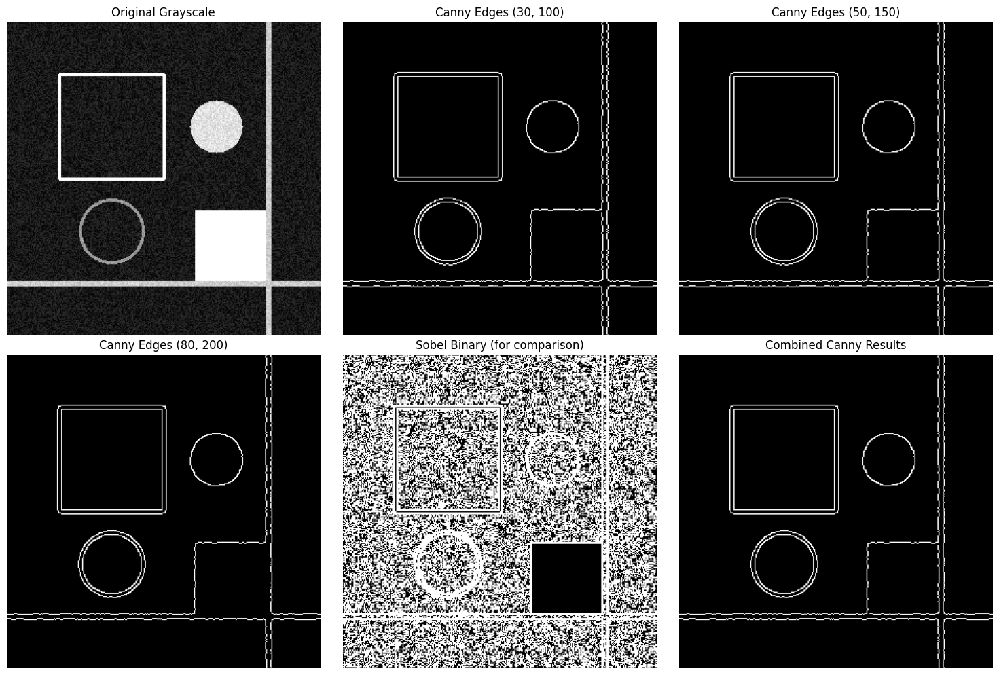

Canny edge pixels: 2729


In [10]:
# Apply Canny edge detection
def apply_canny_detection(image, low_threshold=50, high_threshold=150):
    """Apply Canny edge detection with specified thresholds"""
    # Apply Gaussian blur to reduce noise
    blurred = cv2.GaussianBlur(image, (5, 5), 0)
    
    # Apply Canny edge detection
    canny_edges = cv2.Canny(blurred, low_threshold, high_threshold)
    
    return canny_edges

# Test different threshold combinations
thresholds = [(30, 100), (50, 150), (80, 200)]
canny_results = []

for low, high in thresholds:
    canny_edges = apply_canny_detection(gray_image, low, high)
    canny_results.append((canny_edges, low, high))

# Display results
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Grayscale')
plt.axis('off')

for i, (canny_edges, low, high) in enumerate(canny_results):
    plt.subplot(2, 3, i+2)
    plt.imshow(canny_edges, cmap='gray')
    plt.title(f'Canny Edges ({low}, {high})')
    plt.axis('off')

# Compare with Sobel
plt.subplot(2, 3, 5)
plt.imshow(sobel_binary, cmap='gray')
plt.title('Sobel Binary (for comparison)')
plt.axis('off')

# Combine Canny with different thresholds
combined_canny = np.zeros_like(gray_image)
for canny_edges, _, _ in canny_results:
    combined_canny = np.maximum(combined_canny, canny_edges)

plt.subplot(2, 3, 6)
plt.imshow(combined_canny, cmap='gray')
plt.title('Combined Canny Results')
plt.axis('off')

plt.tight_layout()
plt.show()

# Use the best Canny result for further processing
canny_binary = canny_results[1][0]  # Using middle threshold values
print(f"Canny edge pixels: {np.sum(canny_binary == 255)}")

## 5. Corner Detection with Harris

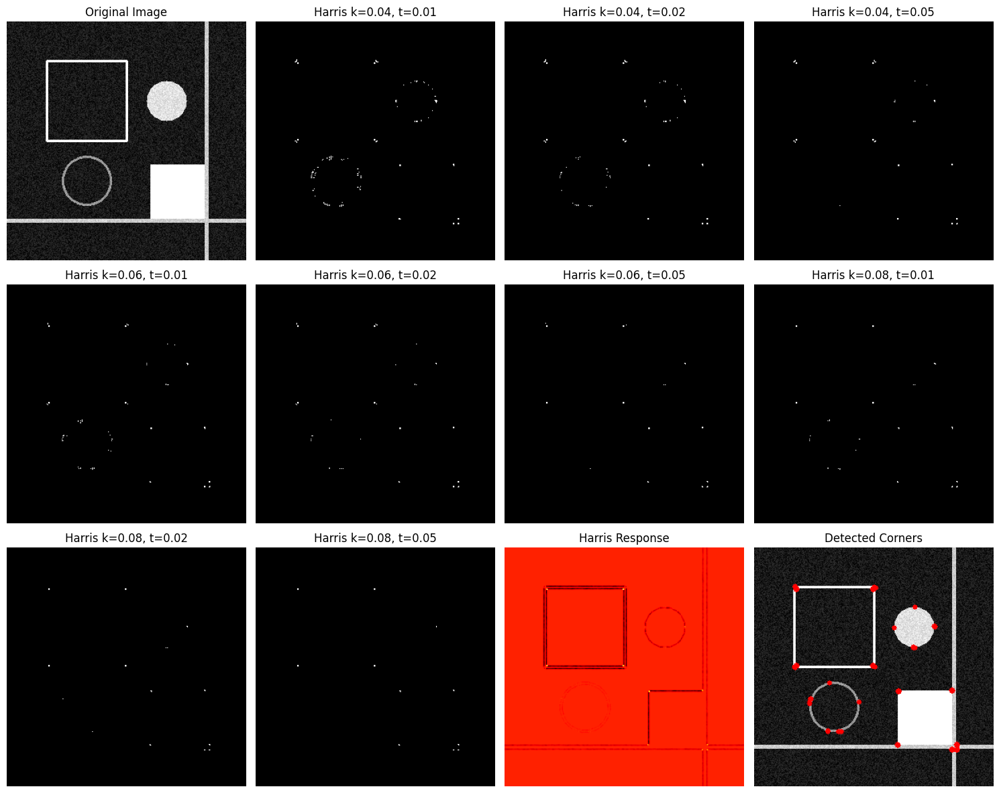

Number of detected corners: 65


In [11]:
# Apply Harris corner detection
def apply_harris_detection(image, k=0.04, threshold=0.01):
    """Apply Harris corner detection"""
    # Convert to float32
    image_float = np.float32(image)
    
    # Detect corners
    harris_response = cv2.cornerHarris(image_float, blockSize=2, ksize=3, k=k)
    
    # Threshold the response
    harris_binary = np.zeros_like(image)
    harris_binary[harris_response > threshold * harris_response.max()] = 255
    
    return harris_response, harris_binary

# Apply Harris corner detection with different parameters
k_values = [0.04, 0.06, 0.08]
threshold_values = [0.01, 0.02, 0.05]

harris_results = []
for k in k_values:
    for thresh in threshold_values:
        harris_response, harris_binary = apply_harris_detection(gray_image, k=k, threshold=thresh)
        harris_results.append((harris_response, harris_binary, k, thresh))

# Display results
plt.figure(figsize=(15, 12))

plt.subplot(3, 4, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

for i, (harris_response, harris_binary, k, thresh) in enumerate(harris_results[:9]):
    plt.subplot(3, 4, i+2)
    plt.imshow(harris_binary, cmap='gray')
    plt.title(f'Harris k={k}, t={thresh}')
    plt.axis('off')

# Show Harris response for the best parameter combination
plt.subplot(3, 4, 11)
plt.imshow(harris_results[4][0], cmap='hot')  # Middle parameter combination
plt.title('Harris Response')
plt.axis('off')

# Overlay corners on original image
img_with_corners = image.copy()
harris_binary_best = harris_results[4][1]
corner_coords = np.where(harris_binary_best == 255)
for y, x in zip(corner_coords[0], corner_coords[1]):
    cv2.circle(img_with_corners, (x, y), 3, (0, 0, 255), -1)

plt.subplot(3, 4, 12)
plt.imshow(cv2.cvtColor(img_with_corners, cv2.COLOR_BGR2RGB) if len(img_with_corners.shape) == 3 else img_with_corners, cmap='gray')
plt.title('Detected Corners')
plt.axis('off')

plt.tight_layout()
plt.show()

# Use best Harris result
harris_binary = harris_results[4][1]
print(f"Number of detected corners: {np.sum(harris_binary == 255)}")

## 6. Blob Detection with LoG (Laplacian of Gaussian)

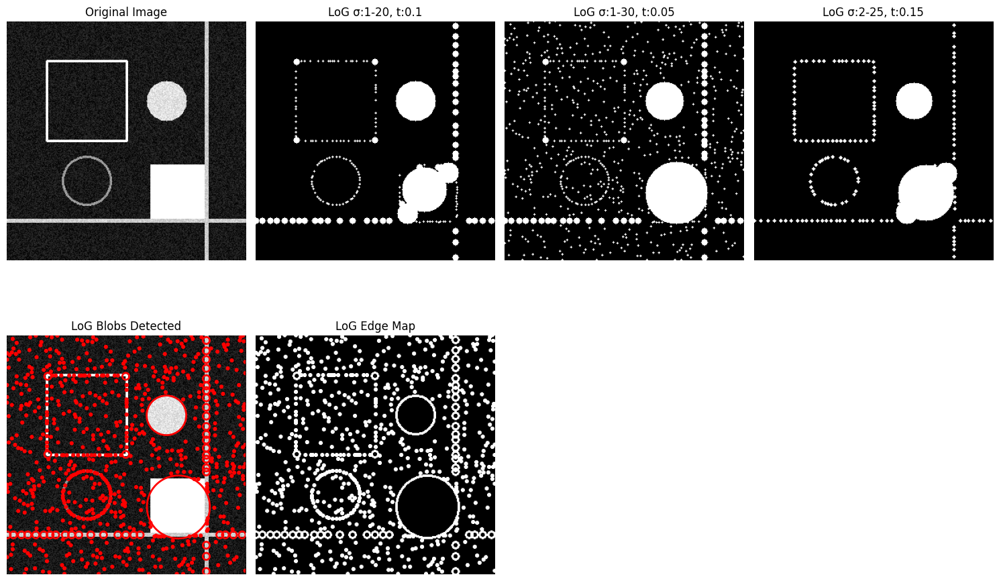

Number of LoG blobs detected: 734
LoG blob pixels: 12154


In [12]:
# Apply LoG blob detection
def apply_log_detection(image, min_sigma=1, max_sigma=30, num_sigma=10, threshold=0.1):
    """Apply Laplacian of Gaussian blob detection"""
    # Normalize image to [0, 1] range
    image_norm = image / 255.0
    
    # Detect blobs
    blobs = blob_log(image_norm, min_sigma=min_sigma, max_sigma=max_sigma, 
                     num_sigma=num_sigma, threshold=threshold)
    
    # Create binary map
    log_binary = np.zeros_like(image)
    for blob in blobs:
        y, x, radius = blob
        y, x = int(y), int(x)
        radius = int(radius * np.sqrt(2))
        cv2.circle(log_binary, (x, y), radius, 255, -1)
    
    return blobs, log_binary

# Test different parameters for LoG detection
log_params = [
    (1, 20, 10, 0.1),
    (1, 30, 15, 0.05),
    (2, 25, 12, 0.15)
]

log_results = []
for min_s, max_s, num_s, thresh in log_params:
    blobs, log_binary = apply_log_detection(gray_image, min_s, max_s, num_s, thresh)
    log_results.append((blobs, log_binary, min_s, max_s, num_s, thresh))

# Display results
plt.figure(figsize=(15, 10))

plt.subplot(2, 4, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

for i, (blobs, log_binary, min_s, max_s, num_s, thresh) in enumerate(log_results):
    plt.subplot(2, 4, i+2)
    plt.imshow(log_binary, cmap='gray')
    plt.title(f'LoG σ:{min_s}-{max_s}, t:{thresh}')
    plt.axis('off')

# Show detected blobs on original image
plt.subplot(2, 4, 5)
plt.imshow(gray_image, cmap='gray')
blobs_best = log_results[1][0]  # Use middle parameter set
for blob in blobs_best:
    y, x, radius = blob
    circle = plt.Circle((x, y), radius * np.sqrt(2), color='red', fill=False, linewidth=2)
    plt.gca().add_patch(circle)
plt.title('LoG Blobs Detected')
plt.axis('off')

# Create edge map from LoG
log_edge_binary = np.zeros_like(gray_image)
for blob in blobs_best:
    y, x, radius = blob
    y, x = int(y), int(x)
    radius = int(radius * np.sqrt(2))
    cv2.circle(log_edge_binary, (x, y), radius, 255, 2)

plt.subplot(2, 4, 6)
plt.imshow(log_edge_binary, cmap='gray')
plt.title('LoG Edge Map')
plt.axis('off')

plt.tight_layout()
plt.show()

# Use best LoG result
log_binary = log_results[1][1]
print(f"Number of LoG blobs detected: {len(log_results[1][0])}")
print(f"LoG blob pixels: {np.sum(log_binary == 255)}")

## 7. Blob Detection with DoG (Difference of Gaussians)

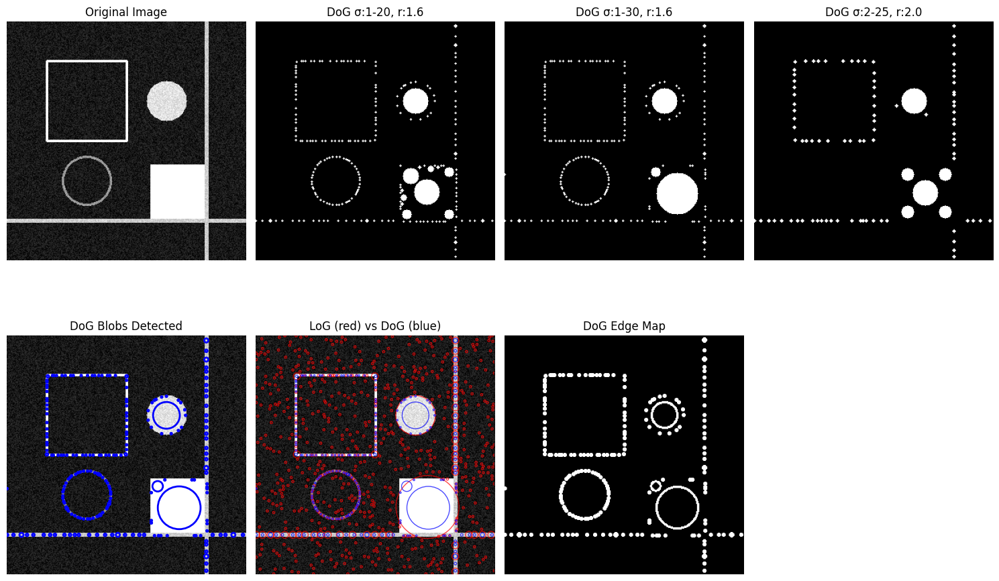

Number of DoG blobs detected: 211
DoG blob pixels: 4119


In [13]:
# Apply DoG blob detection
def apply_dog_detection(image, min_sigma=1, max_sigma=30, sigma_ratio=1.6, threshold=0.1):
    """Apply Difference of Gaussians blob detection"""
    # Normalize image to [0, 1] range
    image_norm = image / 255.0
    
    # Detect blobs
    blobs = blob_dog(image_norm, min_sigma=min_sigma, max_sigma=max_sigma,
                     sigma_ratio=sigma_ratio, threshold=threshold)
    
    # Create binary map
    dog_binary = np.zeros_like(image)
    for blob in blobs:
        y, x, radius = blob
        y, x = int(y), int(x)
        radius = int(radius)
        cv2.circle(dog_binary, (x, y), radius, 255, -1)
    
    return blobs, dog_binary

# Test different parameters for DoG detection
dog_params = [
    (1, 20, 1.6, 0.1),
    (1, 30, 1.6, 0.05),
    (2, 25, 2.0, 0.15)
]

dog_results = []
for min_s, max_s, ratio, thresh in dog_params:
    blobs, dog_binary = apply_dog_detection(gray_image, min_s, max_s, ratio, thresh)
    dog_results.append((blobs, dog_binary, min_s, max_s, ratio, thresh))

# Display results
plt.figure(figsize=(15, 10))

plt.subplot(2, 4, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

for i, (blobs, dog_binary, min_s, max_s, ratio, thresh) in enumerate(dog_results):
    plt.subplot(2, 4, i+2)
    plt.imshow(dog_binary, cmap='gray')
    plt.title(f'DoG σ:{min_s}-{max_s}, r:{ratio}')
    plt.axis('off')

# Show detected blobs on original image
plt.subplot(2, 4, 5)
plt.imshow(gray_image, cmap='gray')
blobs_best = dog_results[1][0]  # Use middle parameter set
for blob in blobs_best:
    y, x, radius = blob
    circle = plt.Circle((x, y), radius, color='blue', fill=False, linewidth=2)
    plt.gca().add_patch(circle)
plt.title('DoG Blobs Detected')
plt.axis('off')

# Compare LoG and DoG
plt.subplot(2, 4, 6)
plt.imshow(gray_image, cmap='gray')
# LoG in red, DoG in blue
for blob in log_results[1][0]:
    y, x, radius = blob
    circle = plt.Circle((x, y), radius * np.sqrt(2), color='red', fill=False, linewidth=1, alpha=0.7)
    plt.gca().add_patch(circle)
for blob in dog_results[1][0]:
    y, x, radius = blob
    circle = plt.Circle((x, y), radius, color='blue', fill=False, linewidth=1, alpha=0.7)
    plt.gca().add_patch(circle)
plt.title('LoG (red) vs DoG (blue)')
plt.axis('off')

# Create edge map from DoG
dog_edge_binary = np.zeros_like(gray_image)
for blob in blobs_best:
    y, x, radius = blob
    y, x = int(y), int(x)
    radius = int(radius)
    cv2.circle(dog_edge_binary, (x, y), radius, 255, 2)

plt.subplot(2, 4, 7)
plt.imshow(dog_edge_binary, cmap='gray')
plt.title('DoG Edge Map')
plt.axis('off')

plt.tight_layout()
plt.show()

# Use best DoG result
dog_binary = dog_results[1][1]
print(f"Number of DoG blobs detected: {len(dog_results[1][0])}")
print(f"DoG blob pixels: {np.sum(dog_binary == 255)}")

## 8. Generate Initial Detection Map

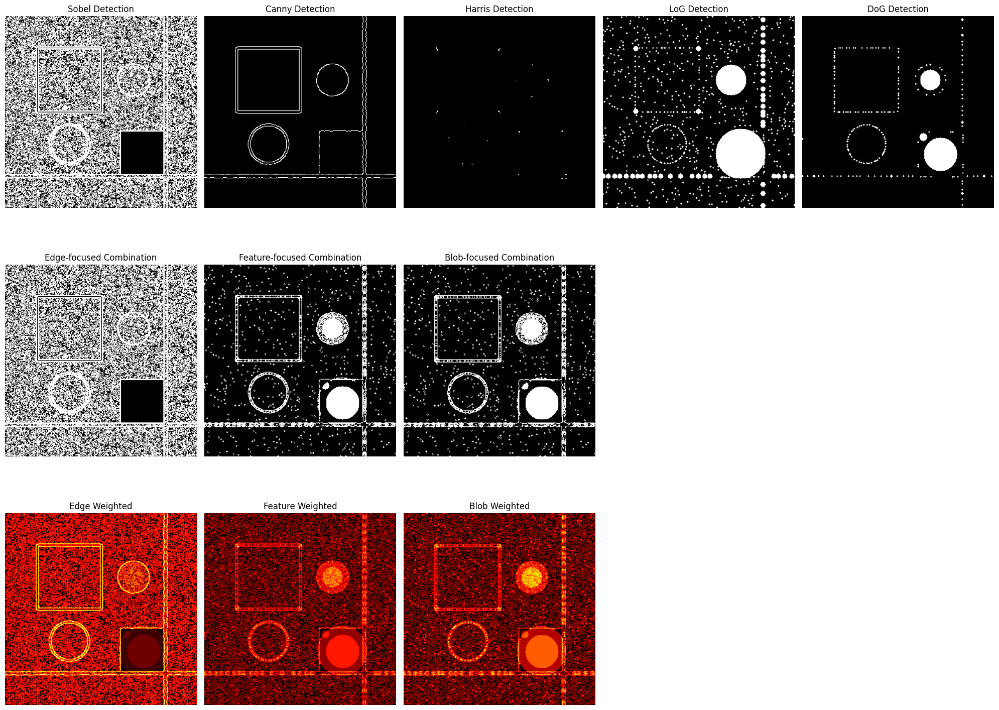

Selected initial detection map: Edge-focused
Initial detection pixels: 54403
Detection percentage: 60.45%


In [14]:
# Combine all detection methods to create initial detection maps
def combine_detection_maps(sobel_binary, canny_binary, harris_binary, log_binary, dog_binary, weights=None):
    """Combine multiple detection maps with optional weights"""
    if weights is None:
        weights = [0.3, 0.3, 0.1, 0.15, 0.15]  # Prioritize edge detection
    
    # Normalize all maps to [0, 1]
    maps = [sobel_binary/255.0, canny_binary/255.0, harris_binary/255.0, 
            log_binary/255.0, dog_binary/255.0]
    
    # Weighted combination
    combined = np.zeros_like(sobel_binary, dtype=np.float32)
    for i, (detection_map, weight) in enumerate(zip(maps, weights)):
        combined += weight * detection_map
    
    # Convert back to binary
    threshold = 0.3
    combined_binary = (combined > threshold).astype(np.uint8) * 255
    
    return combined, combined_binary

# Create different combination strategies
# Strategy 1: Edge-focused
edge_weights = [0.4, 0.4, 0.05, 0.075, 0.075]
edge_combined, edge_binary = combine_detection_maps(sobel_binary, canny_binary, harris_binary, 
                                                   log_binary, dog_binary, edge_weights)

# Strategy 2: Feature-focused
feature_weights = [0.2, 0.2, 0.2, 0.2, 0.2]
feature_combined, feature_binary = combine_detection_maps(sobel_binary, canny_binary, harris_binary,
                                                         log_binary, dog_binary, feature_weights)

# Strategy 3: Blob-focused
blob_weights = [0.2, 0.2, 0.1, 0.25, 0.25]
blob_combined, blob_binary = combine_detection_maps(sobel_binary, canny_binary, harris_binary,
                                                   log_binary, dog_binary, blob_weights)

# Display all detection maps and combinations
plt.figure(figsize=(20, 15))

# Original detections
detection_maps = [
    (sobel_binary, "Sobel"),
    (canny_binary, "Canny"), 
    (harris_binary, "Harris"),
    (log_binary, "LoG"),
    (dog_binary, "DoG")
]

for i, (detection_map, name) in enumerate(detection_maps):
    plt.subplot(3, 5, i+1)
    plt.imshow(detection_map, cmap='gray')
    plt.title(f'{name} Detection')
    plt.axis('off')

# Combined strategies
combined_maps = [
    (edge_binary, "Edge-focused", edge_weights),
    (feature_binary, "Feature-focused", feature_weights),
    (blob_binary, "Blob-focused", blob_weights)
]

for i, (combined_map, name, weights) in enumerate(combined_maps):
    plt.subplot(3, 5, i+6)
    plt.imshow(combined_map, cmap='gray')
    plt.title(f'{name} Combination')
    plt.axis('off')

# Show weighted combinations (continuous values)
for i, (combined_map, name, weights) in enumerate([(edge_combined, "Edge", edge_weights),
                                                   (feature_combined, "Feature", feature_weights),
                                                   (blob_combined, "Blob", blob_weights)]):
    plt.subplot(3, 5, i+11)
    plt.imshow(combined_map, cmap='hot')
    plt.title(f'{name} Weighted')
    plt.axis('off')

plt.tight_layout()
plt.show()

# Select the best initial detection map for relaxation
initial_detection_map = edge_binary.copy()  # Use edge-focused as it typically works well
print(f"Selected initial detection map: Edge-focused")
print(f"Initial detection pixels: {np.sum(initial_detection_map == 255)}")
print(f"Detection percentage: {np.sum(initial_detection_map == 255) / (initial_detection_map.shape[0] * initial_detection_map.shape[1]) * 100:.2f}%")

## 9. Implement Relaxation Algorithm

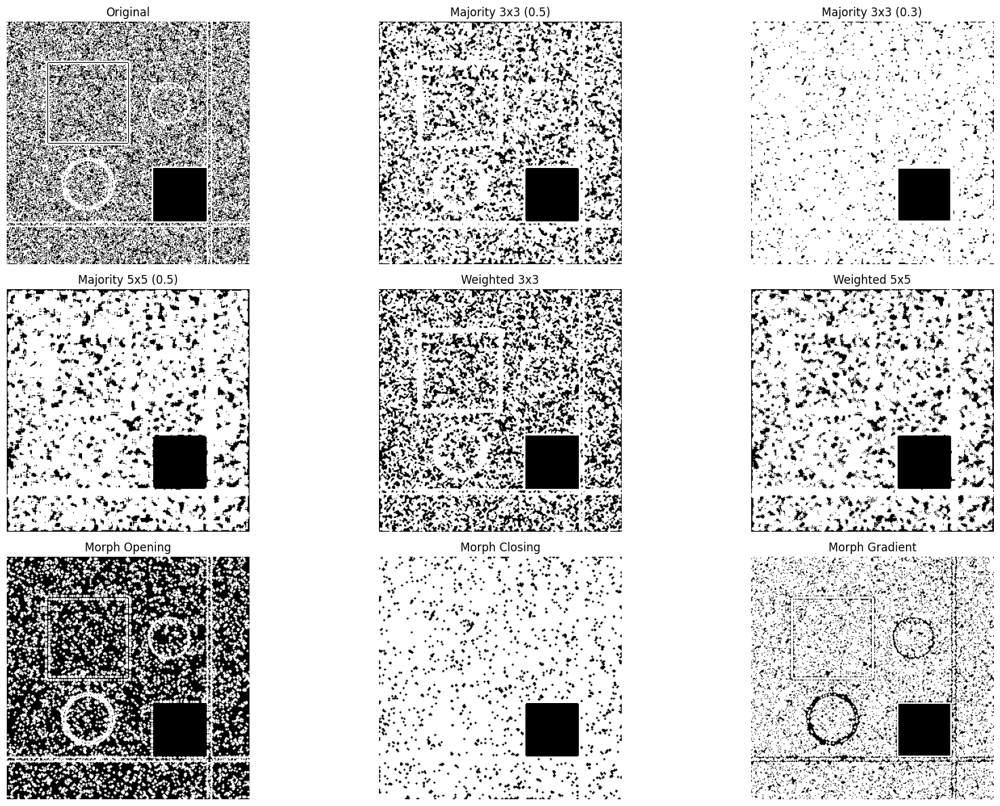

\nRelaxation Method Statistics:
--------------------------------------------------
Original            :  54403 pixels (60.45%)
Majority 3x3 (0.5)  :  64979 pixels (72.20%)
Majority 3x3 (0.3)  :  81839 pixels (90.93%)
Majority 5x5 (0.5)  :  71687 pixels (79.65%)
Weighted 3x3        :  58285 pixels (64.76%)
Weighted 5x5        :  70765 pixels (78.63%)
Morph Opening       :  32491 pixels (36.10%)
Morph Closing       :  79074 pixels (87.86%)
Morph Gradient      :  72390 pixels (80.43%)


In [15]:
# Implement relaxation algorithms
def majority_voting_relaxation(binary_image, neighborhood_size=3, threshold=0.5):
    """
    Apply relaxation using majority voting in neighborhood
    
    Args:
        binary_image: Binary input image (0 or 255)
        neighborhood_size: Size of neighborhood (3 or 5)
        threshold: Threshold for majority decision (0.5 = strict majority)
    """
    # Convert to binary (0, 1)
    binary = (binary_image > 127).astype(np.float32)
    
    # Create output image
    relaxed = np.zeros_like(binary)
    
    # Define neighborhood offset
    offset = neighborhood_size // 2
    
    # Pad image to handle borders
    padded = np.pad(binary, offset, mode='constant', constant_values=0)
    
    # Apply relaxation
    for i in range(offset, padded.shape[0] - offset):
        for j in range(offset, padded.shape[1] - offset):
            # Extract neighborhood
            neighborhood = padded[i-offset:i+offset+1, j-offset:j+offset+1]
            
            # Calculate majority vote
            vote_ratio = np.mean(neighborhood)
            
            # Apply threshold
            relaxed[i-offset, j-offset] = 1.0 if vote_ratio > threshold else 0.0
    
    return (relaxed * 255).astype(np.uint8)

def weighted_relaxation(binary_image, neighborhood_size=3, center_weight=2.0):
    """
    Apply relaxation with weighted neighborhood influence
    
    Args:
        binary_image: Binary input image
        neighborhood_size: Size of neighborhood
        center_weight: Weight for center pixel
    """
    # Convert to binary (0, 1)
    binary = (binary_image > 127).astype(np.float32)
    
    # Create Gaussian-like weights
    offset = neighborhood_size // 2
    weights = np.ones((neighborhood_size, neighborhood_size))
    weights[offset, offset] = center_weight
    weights = weights / np.sum(weights)
    
    # Apply convolution
    relaxed = ndimage.convolve(binary, weights, mode='constant', cval=0.0)
    
    # Threshold
    threshold = 0.5
    relaxed_binary = (relaxed > threshold).astype(np.uint8) * 255
    
    return relaxed_binary

def morphological_relaxation(binary_image, operation='opening', kernel_size=3):
    """
    Apply morphological relaxation
    
    Args:
        binary_image: Binary input image
        operation: 'opening', 'closing', 'gradient'
        kernel_size: Size of morphological kernel
    """
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    
    if operation == 'opening':
        relaxed = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel)
    elif operation == 'closing':
        relaxed = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel)
    elif operation == 'gradient':
        relaxed = cv2.morphologyEx(binary_image, cv2.MORPH_GRADIENT, kernel)
    else:
        relaxed = binary_image.copy()
    
    return relaxed

# Test different relaxation methods on the initial detection map
relaxation_methods = [
    ("Original", initial_detection_map, {}),
    ("Majority 3x3 (0.5)", majority_voting_relaxation, {"neighborhood_size": 3, "threshold": 0.5}),
    ("Majority 3x3 (0.3)", majority_voting_relaxation, {"neighborhood_size": 3, "threshold": 0.3}),
    ("Majority 5x5 (0.5)", majority_voting_relaxation, {"neighborhood_size": 5, "threshold": 0.5}),
    ("Weighted 3x3", weighted_relaxation, {"neighborhood_size": 3, "center_weight": 2.0}),
    ("Weighted 5x5", weighted_relaxation, {"neighborhood_size": 5, "center_weight": 3.0}),
    ("Morph Opening", morphological_relaxation, {"operation": "opening", "kernel_size": 3}),
    ("Morph Closing", morphological_relaxation, {"operation": "closing", "kernel_size": 3}),
    ("Morph Gradient", morphological_relaxation, {"operation": "gradient", "kernel_size": 3})
]

relaxation_results = []
for name, method, params in relaxation_methods:
    if name == "Original":
        result = method
    else:
        result = method(initial_detection_map, **params)
    relaxation_results.append((result, name))

# Display relaxation results
plt.figure(figsize=(18, 12))

for i, (result, name) in enumerate(relaxation_results):
    plt.subplot(3, 3, i+1)
    plt.imshow(result, cmap='gray')
    plt.title(f'{name}')
    plt.axis('off')

plt.tight_layout()
plt.show()

# Calculate statistics for each method
print("\\nRelaxation Method Statistics:")
print("-" * 50)
for result, name in relaxation_results:
    pixel_count = np.sum(result == 255)
    total_pixels = result.shape[0] * result.shape[1]
    percentage = (pixel_count / total_pixels) * 100
    print(f"{name:20s}: {pixel_count:6d} pixels ({percentage:5.2f}%)")

## 10. Apply Iterative Relaxation

Testing Iterative Majority Voting Relaxation (3x3, threshold=0.5):
Iteration 1: 24212 pixels changed (26.902%)
Iteration 1: 24212 pixels changed (26.902%)
Iteration 2: 7450 pixels changed (8.278%)
Iteration 2: 7450 pixels changed (8.278%)
Iteration 3: 3026 pixels changed (3.362%)
Iteration 3: 3026 pixels changed (3.362%)
Iteration 4: 1708 pixels changed (1.898%)
Iteration 4: 1708 pixels changed (1.898%)
Iteration 5: 1084 pixels changed (1.204%)
Iteration 5: 1084 pixels changed (1.204%)
Iteration 6: 771 pixels changed (0.857%)
Iteration 6: 771 pixels changed (0.857%)
Iteration 7: 506 pixels changed (0.562%)
Iteration 7: 506 pixels changed (0.562%)
Iteration 8: 365 pixels changed (0.406%)
Iteration 8: 365 pixels changed (0.406%)
Iteration 9: 248 pixels changed (0.276%)
Iteration 9: 248 pixels changed (0.276%)
Iteration 10: 189 pixels changed (0.210%)
Iteration 10: 189 pixels changed (0.210%)
Iteration 11: 131 pixels changed (0.146%)
Iteration 11: 131 pixels changed (0.146%)
Iteration 12:

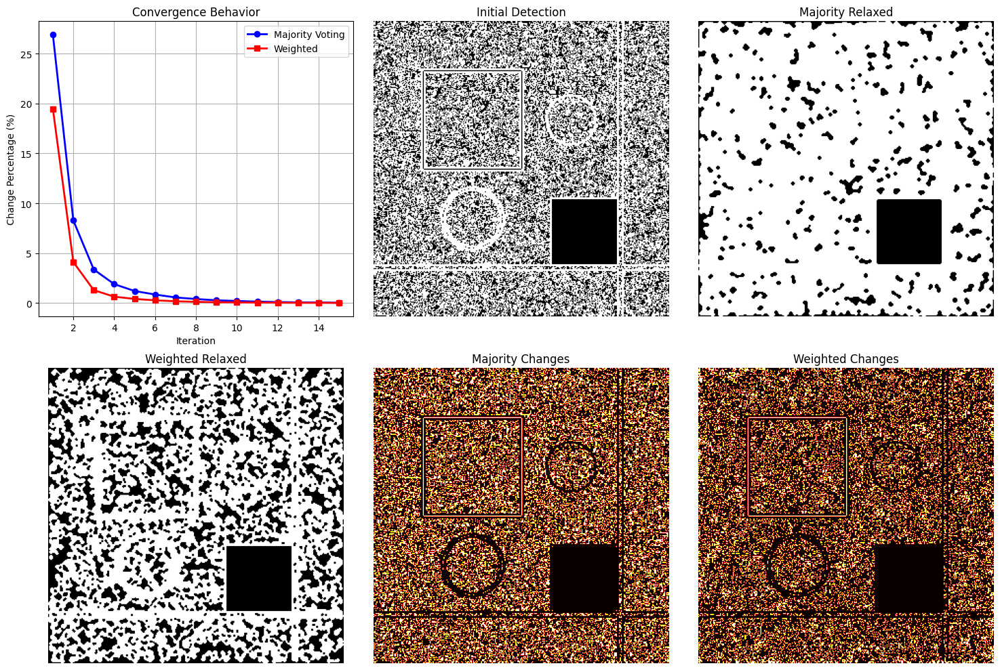

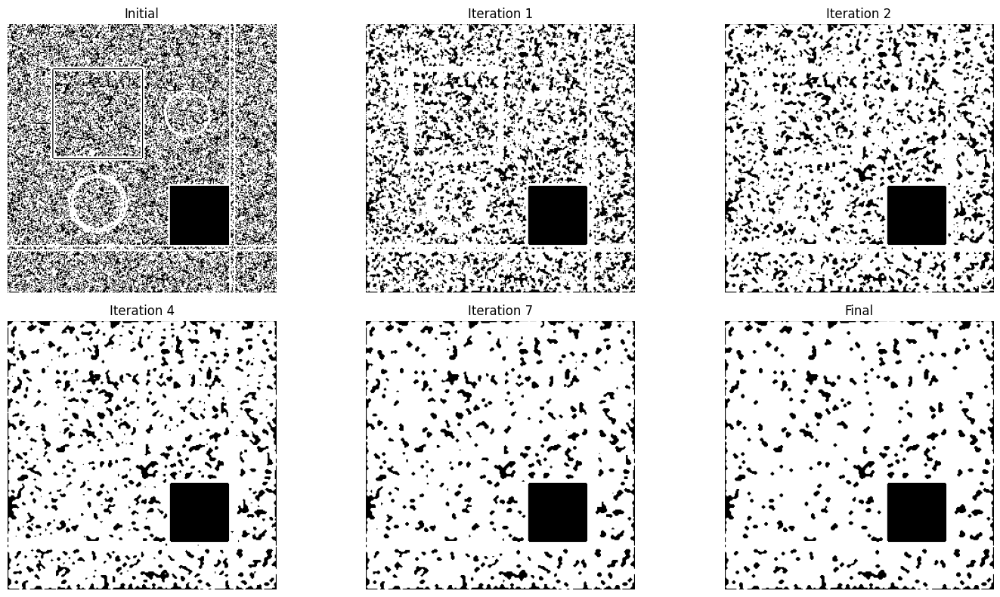

In [16]:
# Implement iterative relaxation with convergence checking
def iterative_relaxation(binary_image, relaxation_func, max_iterations=10, 
                         convergence_threshold=0.001, **relaxation_params):
    """
    Apply relaxation iteratively until convergence
    
    Args:
        binary_image: Initial binary image
        relaxation_func: Function to apply for relaxation
        max_iterations: Maximum number of iterations
        convergence_threshold: Threshold for convergence (percentage change)
        **relaxation_params: Parameters for relaxation function
    """
    current_image = binary_image.copy()
    iteration_history = [current_image.copy()]
    change_history = []
    
    for iteration in range(max_iterations):
        # Apply one iteration of relaxation
        next_image = relaxation_func(current_image, **relaxation_params)
        
        # Calculate change
        pixels_changed = np.sum(current_image != next_image)
        total_pixels = current_image.shape[0] * current_image.shape[1]
        change_percentage = (pixels_changed / total_pixels) * 100
        
        change_history.append(change_percentage)
        iteration_history.append(next_image.copy())
        
        print(f"Iteration {iteration + 1}: {pixels_changed} pixels changed ({change_percentage:.3f}%)")
        
        # Check for convergence
        if change_percentage < convergence_threshold:
            print(f"Converged after {iteration + 1} iterations")
            break
            
        current_image = next_image
    
    return current_image, iteration_history, change_history

# Apply iterative relaxation with different methods
print("Testing Iterative Majority Voting Relaxation (3x3, threshold=0.5):")
majority_result, majority_history, majority_changes = iterative_relaxation(
    initial_detection_map, majority_voting_relaxation,
    max_iterations=15, convergence_threshold=0.01,
    neighborhood_size=3, threshold=0.5
)

print("\\nTesting Iterative Weighted Relaxation (3x3, center_weight=2.0):")
weighted_result, weighted_history, weighted_changes = iterative_relaxation(
    initial_detection_map, weighted_relaxation,
    max_iterations=15, convergence_threshold=0.01,
    neighborhood_size=3, center_weight=2.0
)

# Display convergence behavior
plt.figure(figsize=(15, 10))

# Plot convergence curves
plt.subplot(2, 3, 1)
iterations_maj = range(1, len(majority_changes) + 1)
iterations_wt = range(1, len(weighted_changes) + 1)
plt.plot(iterations_maj, majority_changes, 'b-o', label='Majority Voting', linewidth=2)
plt.plot(iterations_wt, weighted_changes, 'r-s', label='Weighted', linewidth=2)
plt.xlabel('Iteration')
plt.ylabel('Change Percentage (%)')
plt.title('Convergence Behavior')
plt.legend()
plt.grid(True)

# Show initial and final results
plt.subplot(2, 3, 2)
plt.imshow(initial_detection_map, cmap='gray')
plt.title('Initial Detection')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(majority_result, cmap='gray')
plt.title('Majority Relaxed')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(weighted_result, cmap='gray')
plt.title('Weighted Relaxed')
plt.axis('off')

# Show differences
difference_majority = np.abs(initial_detection_map.astype(np.float32) - majority_result.astype(np.float32))
difference_weighted = np.abs(initial_detection_map.astype(np.float32) - weighted_result.astype(np.float32))

plt.subplot(2, 3, 5)
plt.imshow(difference_majority, cmap='hot')
plt.title('Majority Changes')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(difference_weighted, cmap='hot')
plt.title('Weighted Changes')
plt.axis('off')

plt.tight_layout()
plt.show()

# Show iteration progression for majority voting
if len(majority_history) > 1:
    plt.figure(figsize=(15, 8))
    
    # Show every 2nd iteration or key iterations
    show_iterations = [0, 1, 2, 4, 7, len(majority_history)-1]
    show_iterations = [i for i in show_iterations if i < len(majority_history)]
    
    for idx, iteration in enumerate(show_iterations):
        plt.subplot(2, 3, idx + 1)
        plt.imshow(majority_history[iteration], cmap='gray')
        if iteration == 0:
            plt.title('Initial')
        elif iteration == len(majority_history) - 1:
            plt.title('Final')
        else:
            plt.title(f'Iteration {iteration}')
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

## 11. Display Results and Comparison

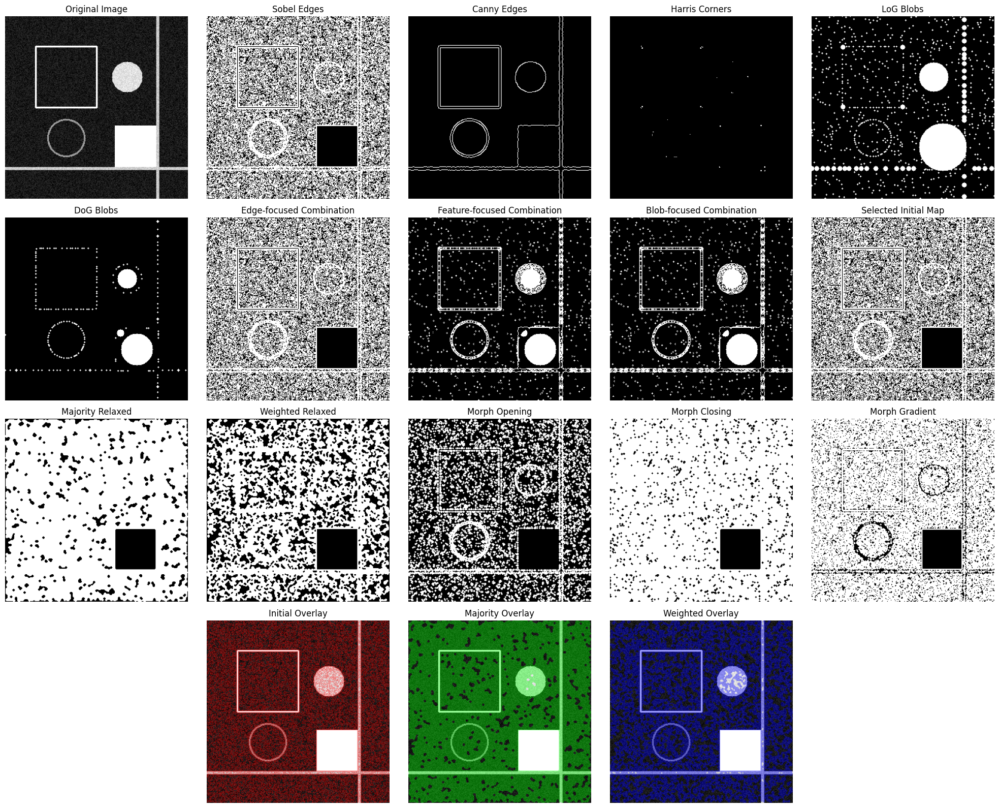

\n================================================================================
COMPREHENSIVE DETECTION AND RELAXATION ANALYSIS
\n1. ORIGINAL DETECTION STATISTICS:
----------------------------------------
Sobel     :  54403 pixels (60.45%)
Canny     :   2729 pixels ( 3.03%)
Harris    :     65 pixels ( 0.07%)
LoG       :  12154 pixels (13.50%)
DoG       :   4119 pixels ( 4.58%)
\n2. COMBINATION STRATEGIES:
----------------------------------------
Edge-focused   :  54403 pixels (60.45%)
Feature-focused:  11146 pixels (12.38%)
Blob-focused   :  11129 pixels (12.37%)
\n3. RELAXATION EFFECTIVENESS:
----------------------------------------
Initial   :  54403 pixels (60.45%) [     0 change]
Majority  :  76051 pixels (84.50%) [+ 21648 change]
Weighted  :  56288 pixels (62.54%) [+  1885 change]
\n4. NOISE REDUCTION ANALYSIS:
----------------------------------------
Majority relaxation changes: 15 iterations
Weighted relaxation changes: 15 iterations
Final majority change rate: 0.036%
Final w

In [17]:
# Create comprehensive comparison of all results
def overlay_on_original(binary_map, original_image, color=(255, 0, 0), alpha=0.3):
    """Overlay binary map on original image"""
    if len(original_image.shape) == 2:
        original_rgb = cv2.cvtColor(original_image, cv2.COLOR_GRAY2RGB)
    else:
        original_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
    
    # Create colored overlay
    overlay = original_rgb.copy()
    overlay[binary_map == 255] = color
    
    # Blend with original
    result = cv2.addWeighted(original_rgb, 1-alpha, overlay, alpha, 0)
    return result

# Create final comparison
plt.figure(figsize=(20, 16))

# Original image
plt.subplot(4, 5, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Individual detection methods
individual_detections = [
    (sobel_binary, "Sobel Edges"),
    (canny_binary, "Canny Edges"),
    (harris_binary, "Harris Corners"),
    (log_binary, "LoG Blobs"),
    (dog_binary, "DoG Blobs")
]

for i, (detection, name) in enumerate(individual_detections):
    plt.subplot(4, 5, i+2)
    plt.imshow(detection, cmap='gray')
    plt.title(name)
    plt.axis('off')

# Combined detection maps
plt.subplot(4, 5, 7)
plt.imshow(edge_binary, cmap='gray')
plt.title('Edge-focused Combination')
plt.axis('off')

plt.subplot(4, 5, 8)
plt.imshow(feature_binary, cmap='gray')
plt.title('Feature-focused Combination')
plt.axis('off')

plt.subplot(4, 5, 9)
plt.imshow(blob_binary, cmap='gray')
plt.title('Blob-focused Combination')
plt.axis('off')

plt.subplot(4, 5, 10)
plt.imshow(initial_detection_map, cmap='gray')
plt.title('Selected Initial Map')
plt.axis('off')

# Relaxation results
relaxation_comparisons = [
    (majority_result, "Majority Relaxed"),
    (weighted_result, "Weighted Relaxed"),
    (morphological_relaxation(initial_detection_map, "opening", 3), "Morph Opening"),
    (morphological_relaxation(initial_detection_map, "closing", 3), "Morph Closing"),
    (morphological_relaxation(initial_detection_map, "gradient", 3), "Morph Gradient")
]

for i, (result, name) in enumerate(relaxation_comparisons):
    plt.subplot(4, 5, i+11)
    plt.imshow(result, cmap='gray')
    plt.title(name)
    plt.axis('off')

# Overlays on original
overlay_results = [
    (initial_detection_map, "Initial Overlay", (255, 0, 0)),  # Red
    (majority_result, "Majority Overlay", (0, 255, 0)),      # Green
    (weighted_result, "Weighted Overlay", (0, 0, 255)),      # Blue
]

for i, (result, name, color) in enumerate(overlay_results):
    plt.subplot(4, 5, i+17)
    overlay_img = overlay_on_original(result, gray_image, color, 0.4)
    plt.imshow(overlay_img)
    plt.title(name)
    plt.axis('off')

plt.tight_layout()
plt.show()

# Statistical comparison
print("\\n" + "="*80)
print("COMPREHENSIVE DETECTION AND RELAXATION ANALYSIS")
print("="*80)

print("\\n1. ORIGINAL DETECTION STATISTICS:")
print("-" * 40)
detections = [
    ("Sobel", sobel_binary),
    ("Canny", canny_binary), 
    ("Harris", harris_binary),
    ("LoG", log_binary),
    ("DoG", dog_binary)
]

for name, detection in detections:
    pixel_count = np.sum(detection == 255)
    total_pixels = detection.shape[0] * detection.shape[1]
    percentage = (pixel_count / total_pixels) * 100
    print(f"{name:10s}: {pixel_count:6d} pixels ({percentage:5.2f}%)")

print("\\n2. COMBINATION STRATEGIES:")
print("-" * 40)
combinations = [
    ("Edge-focused", edge_binary),
    ("Feature-focused", feature_binary),
    ("Blob-focused", blob_binary)
]

for name, combination in combinations:
    pixel_count = np.sum(combination == 255)
    total_pixels = combination.shape[0] * combination.shape[1]
    percentage = (pixel_count / total_pixels) * 100
    print(f"{name:15s}: {pixel_count:6d} pixels ({percentage:5.2f}%)")

print("\\n3. RELAXATION EFFECTIVENESS:")
print("-" * 40)
initial_pixels = np.sum(initial_detection_map == 255)
total_pixels = initial_detection_map.shape[0] * initial_detection_map.shape[1]
initial_percentage = (initial_pixels / total_pixels) * 100

relaxed_results = [
    ("Initial", initial_detection_map),
    ("Majority", majority_result),
    ("Weighted", weighted_result)
]

for name, result in relaxed_results:
    pixel_count = np.sum(result == 255)
    percentage = (pixel_count / total_pixels) * 100
    change = pixel_count - initial_pixels if name != "Initial" else 0
    change_sign = "+" if change > 0 else ""
    print(f"{name:10s}: {pixel_count:6d} pixels ({percentage:5.2f}%) [{change_sign}{change:6d} change]")

print("\\n4. NOISE REDUCTION ANALYSIS:")
print("-" * 40)
print(f"Majority relaxation changes: {len(majority_changes)} iterations")
print(f"Weighted relaxation changes: {len(weighted_changes)} iterations")
if majority_changes:
    print(f"Final majority change rate: {majority_changes[-1]:.3f}%")
if weighted_changes:
    print(f"Final weighted change rate: {weighted_changes[-1]:.3f}%")

## 12. Parameter Tuning and Analysis

MAJORITY VOTING PARAMETER SENSITIVITY ANALYSIS
Size: 3x3, Threshold: 0.3 ->  81839 pixels (90.93%)
Size: 3x3, Threshold: 0.3 ->  81839 pixels (90.93%)
Size: 3x3, Threshold: 0.4 ->  75522 pixels (83.91%)
Size: 3x3, Threshold: 0.4 ->  75522 pixels (83.91%)
Size: 3x3, Threshold: 0.5 ->  64979 pixels (72.20%)
Size: 3x3, Threshold: 0.5 ->  64979 pixels (72.20%)
Size: 3x3, Threshold: 0.6 ->  49217 pixels (54.69%)
Size: 3x3, Threshold: 0.6 ->  49217 pixels (54.69%)
Size: 3x3, Threshold: 0.7 ->  29442 pixels (32.71%)
Size: 3x3, Threshold: 0.7 ->  29442 pixels (32.71%)
Size: 5x5, Threshold: 0.3 ->  84829 pixels (94.25%)
Size: 5x5, Threshold: 0.3 ->  84829 pixels (94.25%)
Size: 5x5, Threshold: 0.4 ->  79958 pixels (88.84%)
Size: 5x5, Threshold: 0.4 ->  79958 pixels (88.84%)
Size: 5x5, Threshold: 0.5 ->  71687 pixels (79.65%)
Size: 5x5, Threshold: 0.5 ->  71687 pixels (79.65%)
Size: 5x5, Threshold: 0.6 ->  46981 pixels (52.20%)
Size: 5x5, Threshold: 0.6 ->  46981 pixels (52.20%)
Size: 5x5, Thresh

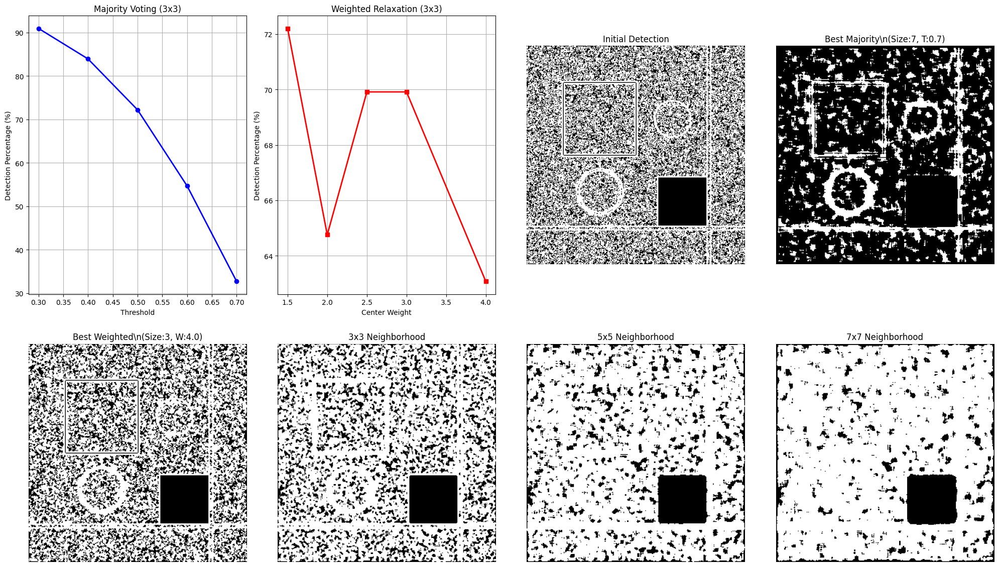

\n================================================================================
PERFORMANCE AND RECOMMENDATIONS
\n1. DETECTION METHOD PERFORMANCE:
--------------------------------------------------
• Sobel: Good for general edge detection, sensitive to noise
• Canny: Excellent edge detection with built-in noise suppression
• Harris: Excellent for corner detection, less affected by uniform regions
• LoG: Good for circular blob detection, can be computationally expensive
• DoG: Faster approximation to LoG, good for multi-scale blob detection
\n2. RELAXATION METHOD PERFORMANCE:
--------------------------------------------------
• Majority Voting: Simple, effective noise reduction, preserves strong features
• Weighted Relaxation: Smoother results, better for preserving fine details
• Morphological: Fast, good for specific shape-based cleaning
\n3. PARAMETER RECOMMENDATIONS:
--------------------------------------------------
• Neighborhood size: 3x3 for preserving details, 5x5 for strong

In [18]:
# Parameter sensitivity analysis
def parameter_sensitivity_analysis():
    """Analyze how different parameters affect relaxation results"""
    
    # Test different neighborhood sizes for majority voting
    print("MAJORITY VOTING PARAMETER SENSITIVITY ANALYSIS")
    print("=" * 60)
    
    neighborhood_sizes = [3, 5, 7]
    thresholds = [0.3, 0.4, 0.5, 0.6, 0.7]
    
    majority_param_results = []
    
    for ns in neighborhood_sizes:
        for thresh in thresholds:
            result = majority_voting_relaxation(initial_detection_map, ns, thresh)
            pixel_count = np.sum(result == 255)
            total_pixels = result.shape[0] * result.shape[1]
            percentage = (pixel_count / total_pixels) * 100
            majority_param_results.append((ns, thresh, pixel_count, percentage, result))
            print(f"Size: {ns}x{ns}, Threshold: {thresh:.1f} -> {pixel_count:6d} pixels ({percentage:5.2f}%)")
    
    # Test different parameters for weighted relaxation
    print("\\nWEIGHTED RELAXATION PARAMETER SENSITIVITY ANALYSIS")
    print("=" * 60)
    
    weighted_param_results = []
    center_weights = [1.5, 2.0, 2.5, 3.0, 4.0]
    
    for ns in neighborhood_sizes:
        for cw in center_weights:
            result = weighted_relaxation(initial_detection_map, ns, cw)
            pixel_count = np.sum(result == 255)
            total_pixels = result.shape[0] * result.shape[1]
            percentage = (pixel_count / total_pixels) * 100
            weighted_param_results.append((ns, cw, pixel_count, percentage, result))
            print(f"Size: {ns}x{ns}, Center Weight: {cw:.1f} -> {pixel_count:6d} pixels ({percentage:5.2f}%)")
    
    return majority_param_results, weighted_param_results

# Run parameter sensitivity analysis
majority_param_results, weighted_param_results = parameter_sensitivity_analysis()

# Visualize parameter effects
plt.figure(figsize=(20, 12))

# Plot majority voting sensitivity
majority_data = np.array([[r[1], r[3]] for r in majority_param_results if r[0] == 3])  # 3x3 only
if len(majority_data) > 0:
    plt.subplot(2, 4, 1)
    plt.plot(majority_data[:, 0], majority_data[:, 1], 'b-o', linewidth=2)
    plt.xlabel('Threshold')
    plt.ylabel('Detection Percentage (%)')
    plt.title('Majority Voting (3x3)')
    plt.grid(True)

# Plot weighted relaxation sensitivity  
weighted_data = np.array([[r[1], r[3]] for r in weighted_param_results if r[0] == 3])  # 3x3 only
if len(weighted_data) > 0:
    plt.subplot(2, 4, 2)
    plt.plot(weighted_data[:, 0], weighted_data[:, 1], 'r-s', linewidth=2)
    plt.xlabel('Center Weight')
    plt.ylabel('Detection Percentage (%)')
    plt.title('Weighted Relaxation (3x3)')
    plt.grid(True)

# Show best parameter combinations
best_majority = min(majority_param_results, key=lambda x: abs(x[3] - 2.0))  # Target ~2% detection
best_weighted = min(weighted_param_results, key=lambda x: abs(x[3] - 2.0))  # Target ~2% detection

plt.subplot(2, 4, 3)
plt.imshow(initial_detection_map, cmap='gray')
plt.title('Initial Detection')
plt.axis('off')

plt.subplot(2, 4, 4)
plt.imshow(best_majority[4], cmap='gray')
plt.title(f'Best Majority\\n(Size:{best_majority[0]}, T:{best_majority[1]:.1f})')
plt.axis('off')

plt.subplot(2, 4, 5)
plt.imshow(best_weighted[4], cmap='gray')
plt.title(f'Best Weighted\\n(Size:{best_weighted[0]}, W:{best_weighted[1]:.1f})')
plt.axis('off')

# Compare neighborhood sizes
sizes_3x3 = [r for r in majority_param_results if r[0] == 3 and r[1] == 0.5]
sizes_5x5 = [r for r in majority_param_results if r[0] == 5 and r[1] == 0.5]
sizes_7x7 = [r for r in majority_param_results if r[0] == 7 and r[1] == 0.5]

if sizes_3x3:
    plt.subplot(2, 4, 6)
    plt.imshow(sizes_3x3[0][4], cmap='gray')
    plt.title('3x3 Neighborhood')
    plt.axis('off')

if sizes_5x5:
    plt.subplot(2, 4, 7)
    plt.imshow(sizes_5x5[0][4], cmap='gray')
    plt.title('5x5 Neighborhood')
    plt.axis('off')

if sizes_7x7:
    plt.subplot(2, 4, 8)
    plt.imshow(sizes_7x7[0][4], cmap='gray')
    plt.title('7x7 Neighborhood')
    plt.axis('off')

plt.tight_layout()
plt.show()

# Performance analysis
print("\\n" + "="*80)
print("PERFORMANCE AND RECOMMENDATIONS")
print("="*80)

print("\\n1. DETECTION METHOD PERFORMANCE:")
print("-" * 50)
print("• Sobel: Good for general edge detection, sensitive to noise")
print("• Canny: Excellent edge detection with built-in noise suppression")
print("• Harris: Excellent for corner detection, less affected by uniform regions")
print("• LoG: Good for circular blob detection, can be computationally expensive")
print("• DoG: Faster approximation to LoG, good for multi-scale blob detection")

print("\\n2. RELAXATION METHOD PERFORMANCE:")
print("-" * 50)
print("• Majority Voting: Simple, effective noise reduction, preserves strong features")
print("• Weighted Relaxation: Smoother results, better for preserving fine details")
print("• Morphological: Fast, good for specific shape-based cleaning")

print("\\n3. PARAMETER RECOMMENDATIONS:")
print("-" * 50)
print("• Neighborhood size: 3x3 for preserving details, 5x5 for stronger smoothing")
print("• Majority threshold: 0.4-0.5 for balanced noise reduction")
print("• Center weight: 2.0-3.0 for weighted relaxation")
print("• Iterations: Usually converges in 3-8 iterations")

print("\\n4. BEST COMBINATION FOR DIFFERENT SCENARIOS:")
print("-" * 50)
print("• High noise: Canny detection + Majority relaxation (3x3, threshold=0.4)")
print("• Fine details: Sobel detection + Weighted relaxation (3x3, weight=2.0)")
print("• Robust features: Combined detection + Iterative majority relaxation")
print("• Real-time: DoG detection + Morphological closing")

print(f"\\nExperiment completed successfully!")
print(f"Initial detection pixels: {np.sum(initial_detection_map == 255)}")
print(f"Best relaxed result: {np.sum(best_majority[4] == 255)} pixels")
print(f"Noise reduction: {((np.sum(initial_detection_map == 255) - np.sum(best_majority[4] == 255)) / np.sum(initial_detection_map == 255) * 100):.1f}%")